In [1]:
import pandas as pd 
import numpy as np 
import wordcloud
import seaborn as sns 
import matplotlib.pyplot as plt 
import random
import os
import sys
import warnings

warnings.filterwarnings("ignore")

In [11]:
train_data_path = "/opt/ml/code/input/train.csv"
test_data_path = "/opt/ml/code/input/sample_submission.csv"

train_data = pd.read_csv(train_data_path, parse_dates=['order_date'])
test_data = pd.read_csv(test_data_path)

In [6]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 780502 entries, 0 to 780501
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   order_id     780502 non-null  object        
 1   product_id   780502 non-null  object        
 2   description  780502 non-null  object        
 3   quantity     780502 non-null  int64         
 4   order_date   780502 non-null  datetime64[ns]
 5   price        780502 non-null  float64       
 6   customer_id  780502 non-null  int64         
 7   country      780502 non-null  object        
 8   total        780502 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(4)
memory usage: 53.6+ MB


In [7]:
train_data.describe()

,quantity,price,customer_id,total
count,780502.000000,780502.000000,780502.000000,780502.000000
mean,12.623307,6.140931,15313.393466,33.715373
std,143.906302,119.042266,1695.765797,274.207403
min,-74215.000000,0.000000,12346.000000,-127352.940000
25%,2.000000,2.062500,13963.000000,7.260000
50%,5.000000,3.217500,15239.000000,19.470000
75%,12.000000,6.187500,16788.000000,32.175000
max,74215.000000,64300.500000,18287.000000,127352.940000


In [6]:
train_data.head(10)

,order_id,product_id,description,quantity,order_date,price,customer_id,country,total
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,11.4675,13085,United Kingdom,137.610
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,11.1375,13085,United Kingdom,133.650
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,11.1375,13085,United Kingdom,133.650
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,3.4650,13085,United Kingdom,166.320
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,2.0625,13085,United Kingdom,49.500
5,489434,22064,PINK DOUGHNUT TRINKET POT,24,2009-12-01 07:45:00,2.7225,13085,United Kingdom,65.340
6,489434,21871,SAVE THE PLANET MUG,24,2009-12-01 07:45:00,2.0625,13085,United Kingdom,49.500
7,489434,21523,FANCY FONT HOME SWEET HOME DOORMAT,10,2009-12-01 07:45:00,9.8175,13085,United Kingdom,98.175
8,489435,22350,CAT BOWL,12,2009-12-01 07:46:00,4.2075,13085,United Kingdom,50.490
9,489435,22349,"DOG BOWL , CHASING BALL DESIGN",12,2009-12-01 07:46:00,6.1875,13085,United Kingdom,74.250


In [8]:
pd.unique(train_data.product_id)

array(['85048', '79323P', '79323W', ..., '23576', '23562', '23561'],
      dtype=object)

In [9]:
len(pd.unique(train_data.product_id))

4645

In [12]:
train_data['year_month'] = train_data['order_date'].dt.strftime('%Y-%m')
train_data['year'] = train_data['order_date'].dt.strftime('%Y')

train data는 order_id, product_id, description, quantity, order_date, price, customer_id, country, total로 이루어져 있는 것을 알 수 있다.
우선 여기서 하나하나 따져가며 EDA를 해보고 데이터를 가공하여 EDA를 한다음, 어떤 기준으로 데이터를 가공하여 학습을 시켜볼지 고민해보자.

# 1. order_id
주문 번호이다. 여기서 우리가 알아 낼 수 있는 것은   

1. 평균적으로 한 주문에 몇가지의 제품을 구매하는가.    
2. 한 고객당 평균적으로 하나의 주문에서 소비하는 금액   
3. 한 달동안 주문횟수 
등이 존재할 것으로 생각된다. 


In [13]:
order_data = train_data.groupby("order_id")

order_id = []
customer_id = []
total_price = []
order_product = []
product_id = []
date = []
date_year = []

for key, group in order_data:
    order_id.append(key)
    temp_customer_id = 0
    temp_price = 0
    temp_product = len(group)
    temp_product_id = []
    temp_date = 0
    temp_year = 0
    for i, data in group.iterrows():
        temp_customer_id = data.customer_id
        temp_price += data.total
        temp_product_id.append(data.product_id)
        temp_date = data.year_month
        temp_year = data.year	
    customer_id.append(temp_customer_id)
    total_price.append(temp_price)
    order_product.append(temp_product)
    product_id.append(temp_product_id)
    date.append(temp_date)
    date_year.append(temp_year)

order_data_df = pd.DataFrame({
                    "order_id" : order_id,
                    "customer_id": customer_id,
                    "product_list": product_id,
                    "product_quantity": order_product,
                    "total_price": total_price,
                    "order_month": date,
                    "order_year": date_year
})
order_data_df

,order_id,customer_id,product_list,product_quantity,total_price,order_month,order_year
0,489434,13085,"[85048, 79323P, 79323W, 22041, 21232, 22064, 2...",8,833.7450,2009-12,2009
1,489435,13085,"[22350, 22349, 22195, 22353]",4,240.5700,2009-12,2009
2,489436,13078,"[48173C, 21755, 21754, 84879, 22119, 22142, 22...",19,1040.0445,2009-12,2009
3,489437,15362,"[22143, 22145, 22130, 21364, 21360, 21351, 213...",23,512.7375,2009-12,2009
4,489438,18102,"[21329, 21252, 21100, 21033, 20711, 21410, 214...",17,3772.2960,2009-12,2009
...,...,...,...,...,...,...,...
43950,C579882,13050,"[21871, 23245]",2,-24.5025,2011-11,2011
43951,C579883,14194,"[21535, 23254]",2,-31.5975,2011-11,2011
43952,C579884,14527,[D],1,-33.8745,2011-11,2011
43953,C579886,15676,"[22163, 22578, 23370, 22594, 21172, 23491, 850...",12,-150.5955,2011-11,2011


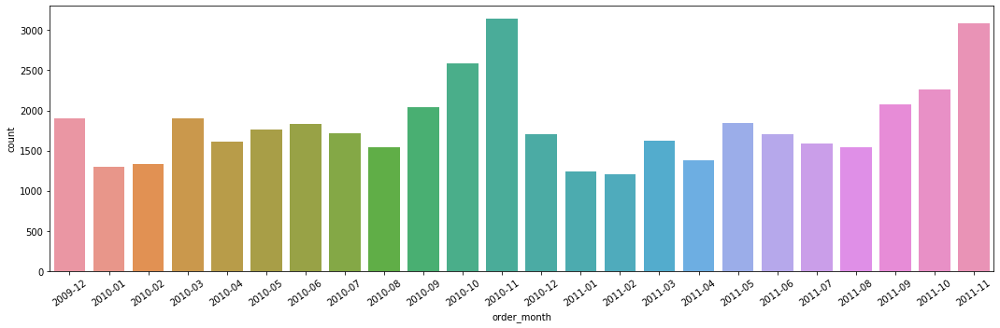

In [19]:
#한달 동안의 주문 횟수

plt.figure(figsize=(15, 5))
ax = sns.countplot(x="order_month", data=order_data_df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=35)
plt.tight_layout()
plt.show()

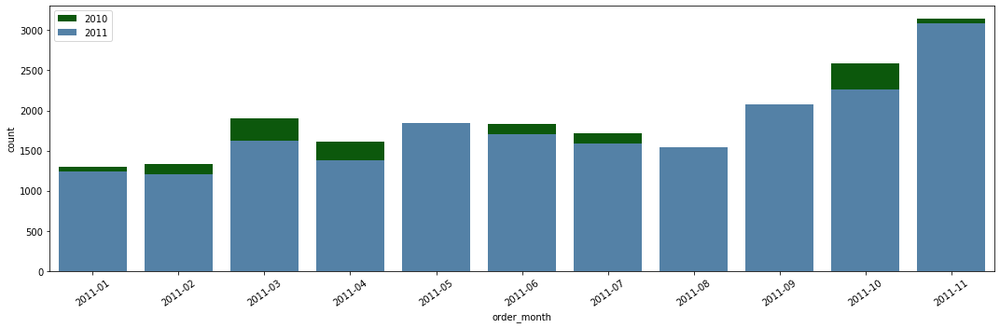

In [12]:
train_data_2010 = order_data_df[order_data_df.order_year == "2010"]
train_data_2011 = order_data_df[order_data_df.order_year == "2011"]

plt.figure(figsize=(15, 5))
#ax = sns.countplot(x="order_month", data=train_data_2011, color="steelBlue")
ax = sns.countplot(x="order_month", data=train_data_2010, color="darkGreen")
ax = sns.countplot(x="order_month", data=train_data_2011, color="steelBlue")
ax.set_xticklabels(ax.get_xticklabels(), rotation=35)
plt.legend(loc="best", labels=["2010", "2011"])
plt.tight_layout()
plt.show()


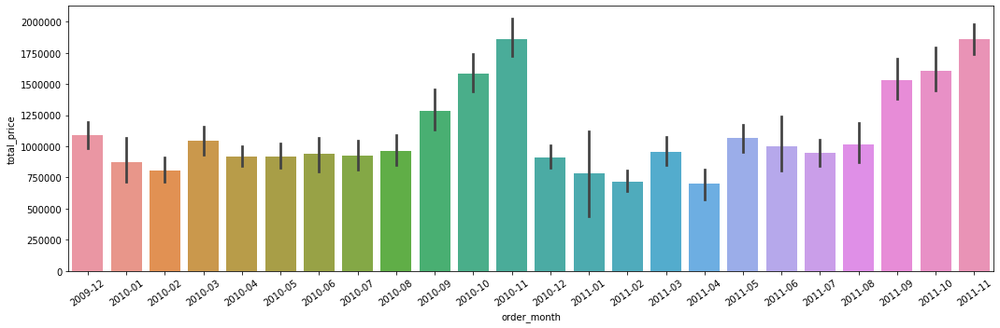

In [20]:
#한달 주문 금액

plt.figure(figsize=(15, 5))
ax = sns.barplot(x="order_month", y="total_price", data=order_data_df, estimator=np.sum)
ax.set_xticklabels(ax.get_xticklabels(), rotation=35)
plt.tight_layout()
plt.show()

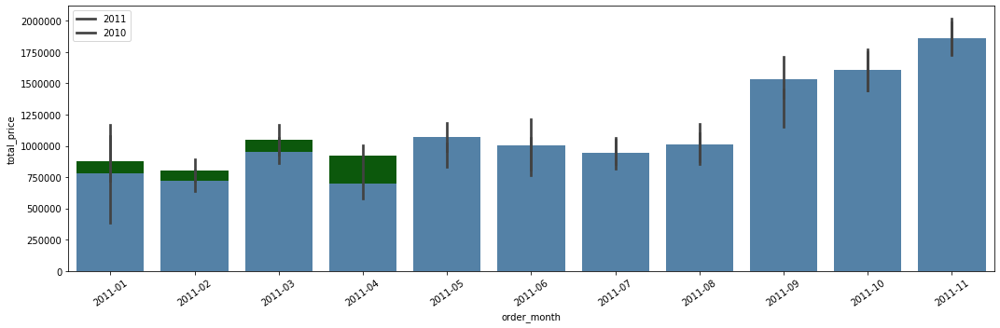

In [18]:
plt.figure(figsize=(15, 5))
#ax = sns.barplot(x="order_month",  y="total_price", data=train_data_2011 , estimator=np.sum, color="navy")
ax = sns.barplot(x="order_month", y="total_price", data=train_data_2010, estimator=np.sum, color="darkGreen")
ax = sns.barplot(x="order_month", y="total_price", data=train_data_2011, estimator=np.sum, color="steelBlue")
ax.set_xticklabels(ax.get_xticklabels(), rotation=35)
plt.legend(loc="best", labels=["2011", "2010"])
plt.tight_layout()
plt.show()

In [14]:
def get_customer_total_price_by_month(customer_id, order_data_df):
    df = order_data_df[order_data_df.customer_id == customer_id]
    month_list = {month: 0 for month in pd.unique(order_data_df.order_month)}

    for i, temp in df.iterrows():
        month_list[temp.order_month] += temp.total_price 
    
    return [val for key, val in month_list.items()]

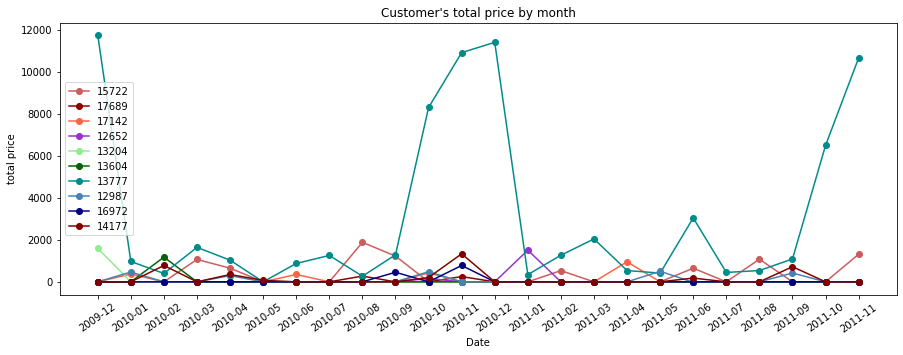

In [23]:
#랜덤으로 가져온 customer 20명의 월별 구매 금액을 통계내어 보자.

selected_customer = random.choices(pd.unique(order_data_df.customer_id), k=10)
color_list = ["indianRed", "darkRed", "tomato", "darkOrchid", "lightGreen", "darkGreen", "darkCyan", "steelBlue", "navy", "maroon"]
plt.figure(figsize=(15, 5))
for i, customer_id in enumerate(selected_customer):
    customer_info = get_customer_total_price_by_month(customer_id, order_data_df)
    plt.plot(pd.unique(order_data_df.order_month), customer_info, marker="o", color=color_list[i%10])
plt.xticks(rotation=35) 
plt.title("Customer's total price by month")
plt.ylabel("total price")
plt.xlabel("Date")
plt.legend(loc="best", labels= selected_customer)
plt.show()

# Product_id    
제품들의 식별자이다.   
1. 아마도 각 식별자간 비슷한 물품들끼리는 비슷한 분류에 속해 있을 것으로 예상된다.   
2. 월별 선호 물품 카테고리가 존재할까??

In [15]:
product_categories = []

for i, data in train_data.iterrows():
    product_categories.append(data.product_id[:3])
train_data["product_category"] = product_categories

In [16]:
product_categories = pd.unique(train_data.product_category)
product_categories

array(['850', '793', '220', '212', '218', '215', '223', '221', '481',
       '217', '848', '222', '350', '825', '211', '213', '845', '354',
       '206', '373', '100', '207', '219', '849', '209', '210', '214',
       '840', '851', '161', '852', '846', 'POS', '842', '820', '359',
       '180', '216', '208', '902', '901', '900', '824', '727', '374',
       '843', '475', '714', '826', '442', '162', '847', '357', '101',
       '150', '460', '844', '728', '790', '720', '358', 'D', '510', '171',
       '170', '700', '160', '750', '722', '375', '224', '351', '721',
       '470', '400', '712', '710', '724', '723', '725', '841', 'M', '795',
       '355', '356', '791', '110', '780', '474', '467', '352', '620',
       '819', '450', 'C2', '461', '794', '751', '473', '771', '711',
       'BAN', 'TES', '715', '440', '371', '781', '726', '770', 'PAD',
       'ADJ', '225', '226', '463', '227', '228', '229', 'SP1', '232',
       '231', '230', '233', '234', '235', 'DOT', 'CRU', '236', '237'],
      dtyp

In [24]:
product_categories = sorted(product_categories, key=lambda x: int(x) if x.isdigit() else 0)

In [25]:
# 위에서 분류한 제품 카테고리에 속하는 제품들의 descipt를 모아서 확인해보자.  

product_descripts = {}

for product_category in product_categories:
    temp_descript = pd.unique(train_data[train_data.product_category == product_category].description)
    temp_text = " ".join(temp_descript)
    product_descripts[product_category] = temp_text


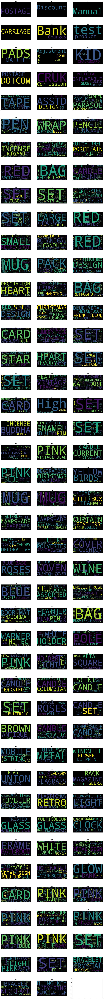

In [26]:
fig, ax = plt.subplots(len(product_categories)//3 + 1, 3, figsize=(20, 200))

for i, (product_category, text) in enumerate(product_descripts.items()):
    word_img = wordcloud.WordCloud(max_font_size=200).generate(text)
    ax[i//3][i%3].imshow(word_img)
    ax[i//3][i%3].set_title(product_category)
    ax[i//3][i%3].axis('off')
    
#plt.axis('off')
plt.show()

In [32]:
#그럼 각 월별 제품의 선호도는 어떻게 될까?  
train_product_category_pivot_count = pd.pivot_table(train_data, index="year_month", columns="product_category",values="quantity", aggfunc = ['sum'], fill_value = 0)
train_product_category_pivot_count


sum                                                    \
product_category   100   101  110    150    160   161   162    170   171   
year_month                                                                 
2009-12            216   646  179   5797   5648  5916  3320   3837  2579   
2010-01            289   490   83   2703  10718  3392  2028   2640  8211   
2010-02            255  1080   17   1654   2851  2793   954   3842   640   
2010-03            633   353   50   2583   2507  4021  1589   9049  1671   
2010-04            929   200   48   3543   3807  1975  1654   4282   226   
2010-05            408   297  105   4273   4140  1067  1532   6562   525   
2010-06            432   220  203  11050   5273  2913   947   5562   590   
2010-07            504   248   48   6223   1761  1924   805   2461   343   
2010-08            569  1558  214   1855  15076  9905  1927   5760   244   
2010-09            221   223  156   1458   2809  2361   788  14609   329   
2010-10           1033   396  962   4725   5701  4751  1903   7168   390   
2010-11            956   656  330   3162   2024  2624  2587  12368   483   
2010-12            224   658   64    570   1694   524  1078   6077    64   
2011-01            337   650   32    949    501  1331   878   4589    33   
2011-02             52   333   16   2693   2561  1124   982   1505    25   
2011-03             23   353   49   4079   2186  1785  1383   4204    74   
2011-04            189   187   35   2955   1084  1823  1193   1777   134   
2011-05              0   151   96   6321   3678  1823   905   3001    62   
2011-06             48   515   96   6007   2389  1794  4406   3892   145   
2011-07             24  1009   53   5305   3139  1856  3446   2951   146   
2011-08             60   901  318   2217   4101  1601  2028   1942    89   
2011-09             60   485   78   1633   3105  2565  2442   3512   106   
2011-10              6   127  110   2862   2727  3987  1963   3787    68   
2011-11             91   284  100   1684   6590  3157  2800   2308   122   

                        ...                                              
product_category   180  ... BAN  C2 CRU    D DOT     M PAD  POS SP1 TES  
year_month              ...                                              
2009-12            470  ...   0   7   0   -6   0     7   0  110   0  26  
2010-01            184  ...   0   3   0 -213   0  -303   2  124   0  20  
2010-02            336  ...   1   4   0 -194   0    50   6  128   0  10  
2010-03           2568  ...   0   7   0  -33   0   516   1  134   0   0  
2010-04             96  ...   2   7   0   -2   0   -81   2  164   0   5  
2010-05            394  ...   2   4   0    0   0   189   0  125   0   0  
2010-06            110  ...   2   8   0   -9   0   240  -1  131   0   0  
2010-07            145  ...   4  11   0 -126   0     4   0  140   0   0  
2010-08            112  ...   2  11   0 -198   0    42   0  104   0   0  
2010-09            183  ...   0   8   0 -861   0    43   1  204   0   0  
2010-10            179  ...  -2  15   0  -13   0    52   0  260   5  -5  
2010-11            444  ...   2  25   0  -16   0   382   2  354   0   0  
2010-12            257  ...   1   9   0   -8   0   190   0  215   0   0  
2011-01            138  ...   1   3   0   -1   0    -3   0  243   0   0  
2011-02           2468  ...   0   4   0   -4   0  -133   0  146   0   0  
2011-03            102  ...   0  14   0 -724   0  -218   0  231   0   0  
2011-04            108  ...   1   8   0   -3   0    79   1  123   0   0  
2011-05            374  ...   1  10   0 -310   0 -1439   0  232   0   0  
2011-06             43  ...   0  11   0 -102   0    21   0  232   0   0  
2011-07           3264  ...   0  10   0   -5   0    27   1  198   0   0  
2011-08             49  ...   0   7  -1  -14   1  -616   0  230   0   0  
2011-09           -274  ...   3  18  -5   -7   5   210   2  271   0   0  
2011-10             16  ...   2  14  -5   -3   5   370   0  332   0   0  
2011-11             20  ...   2  22  -4  -

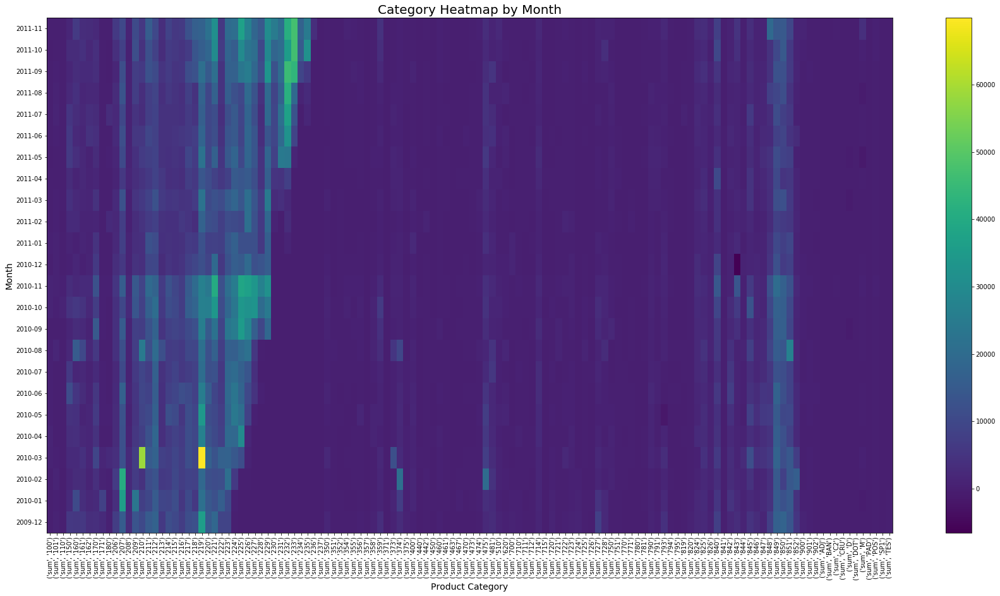

In [81]:
plt.figure(figsize=(30, 15))
plt.pcolor(train_product_category_pivot_count)
plt.xticks(np.arange(0.5, len(train_product_category_pivot_count.columns), 1), train_product_category_pivot_count.columns)
plt.yticks(np.arange(0.5, len(train_product_category_pivot_count.index), 1), train_product_category_pivot_count.index)
plt.title('Category Heatmap by Month', fontsize=20)
plt.xlabel('Product Category', fontsize=14)
plt.ylabel('Month', fontsize=14)
plt.xticks(rotation=90) 
plt.colorbar()
plt.show()

In [82]:
#그럼 각 월별 제품의 구매 액은 어떻게 될까?
train_product_category_pivot_total = pd.pivot_table(train_data, index="year_month", columns="product_category",values="total", aggfunc = ['sum'], fill_value = 0)
train_product_category_pivot_total

sum                                               \
product_category        100        101        110         150        160   
year_month                                                                 
2009-12            302.9400   843.4305   499.1415  31650.7290  2825.4600   
2010-01            405.3225   716.1330   231.4455  13082.7015  1549.7460   
2010-02            357.6375  1855.8375    47.4045   6572.5110   697.0260   
2010-03            791.6865   547.2225   139.4250   9173.8845  1239.5130   
2010-04           1146.3375   231.2145   133.8480  13149.7575   920.0400   
2010-05            567.0720   456.3240   292.7925  12036.2715   810.9420   
2010-06            600.7320   331.6830   552.2055  34748.4390  2643.1020   
2010-07            663.9600   380.1930   133.8480  16682.1930  1240.4370   
2010-08            712.2225   646.7670   596.7390  12012.1650  2453.7645   
2010-09            309.9525   303.3360   435.0060   7894.5735  1036.1505   
2010-10           1277.1825   547.4370  2349.8970  15675.7095  2913.1740   
2010-11           1222.8150  1021.8615   857.3730  11352.9240   774.2295   
2010-12            314.1600   589.0335   178.4640   3885.7830   786.3570   
2011-01            472.6425   539.7150    89.2320   3978.5955   219.3675   
2011-02             72.9300   516.7140    44.6160   6290.5095  1438.9815   
2011-03             32.2575   452.8590   136.6365  10928.1975  1022.3070   
2011-04            265.0725   282.0675    97.5975   6481.0845   560.6040   
2011-05              0.0000   213.8895   267.6960  13708.9095  1933.5360   
2011-06             30.8880   462.7260   267.6960  11769.6645   538.4775   
2011-07             15.4440  1064.0685   147.7905  16759.8750   517.6215   
2011-08             38.6100   848.0175   689.9310   9280.3095  1531.3650   
2011-09             38.6100   590.7330   222.7830   8037.1005   861.1020   
2011-10              3.8610   235.7355   338.4150   9713.9295   417.3510   
2011-11             58.5585   452.2815   286.7700   5149.1880  2647.1940   

                                                                         ...  \
product_category        161        162        170        171        180  ...   
year_month                                                               ...   
2009-12           2629.7535  2033.0145  2737.6140  2362.3875  1132.1805  ...   
2010-01           2102.6280  1863.4110  1178.4300  2968.3830   615.1695  ...   
2010-02           1613.8650   585.3870  2351.9760   811.9485   789.1455  ...   
2010-03           2659.8990  2490.5925  3923.3865  1272.5460   957.8910  ...   
2010-04           1330.6095  1002.3420  1711.7430   359.9970   244.0680  ...   
2010-05            733.9200   833.0355  2675.2110   668.1180   585.3375  ...   
2010-06           1963.8630   419.4630  1837.6380   769.0650   389.6145  ...   
2010-07           1267.3320   443.6850  1136.6025   342.8040   610.7475  ...   
2010-08           3048.0780   798.6000  2215.3560   211.2495   442.2165  ...   
2010-09           1558.6230   374.8635  4852.3035   476.9655   687.1920  ...   
2010-10           3120.8430   916.3935  2640.7920   405.1905   543.2955  ...   
2010-11           1742.5320  1133.6490  4587.9075   536.9100  1397.2530  ...   
2010-12            363.1320   467.3790  2522.0250   186.7470   817.2780  ...   
2011-01            922.3830   385.4730  1630.3485    53.3115   463.0230  ...   
2011-02            778.9320   324.5220   781.3905    82.0215   373.1805  ...   
2011-03           1194.1050   472.9395  1941.3900    91.5420   333.1680  ...   
2011-04           1197.3390   377.9325   814.7700   166.2210   256.6080  ...   
2011-05           1264.4445   347.6220  1364.1375    51.2160  1044.9120  ...   
2011-06           1179.1395   582.0375  1678.0335   159.5055    81.2955  ...   
2011-07           1208.1465   701.7615  1222.5180   132.6930   491.7990  ...   
2011-08           1083.4725   558.4095   992.4915   103.4715   161.2875  ...   
2011-09           1688.1810   428.5215  1656.3525  

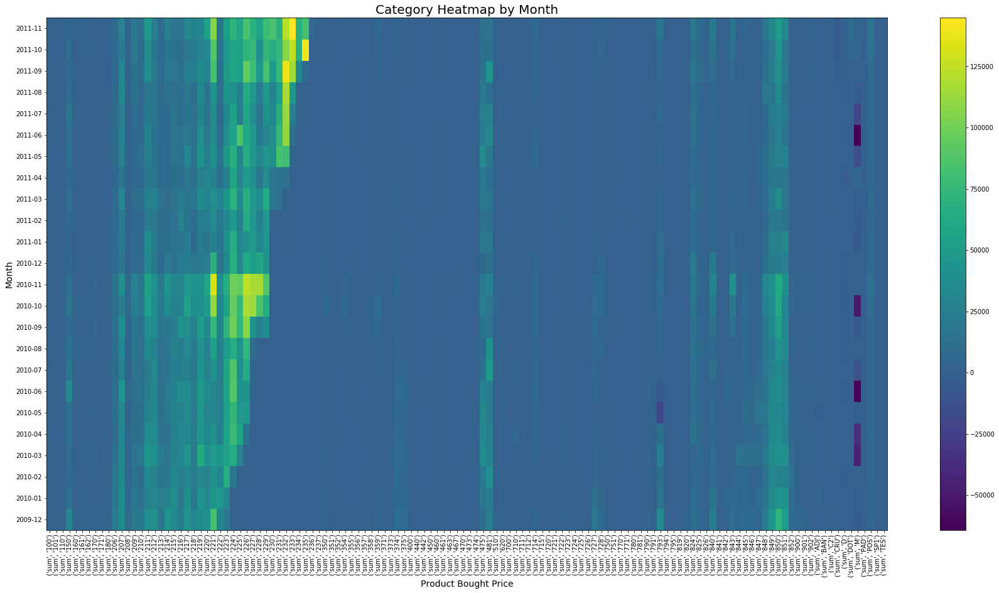

In [85]:
plt.figure(figsize=(30, 15))
plt.pcolor(train_product_category_pivot_total)
plt.xticks(np.arange(0.5, len(train_product_category_pivot_total.columns), 1), train_product_category_pivot_total.columns)
plt.yticks(np.arange(0.5, len(train_product_category_pivot_total.index), 1), train_product_category_pivot_total.index)
plt.title('Category Heatmap by Month', fontsize=20)
plt.xlabel('Product Bought Price', fontsize=14)
plt.ylabel('Month', fontsize=14)
plt.xticks(rotation=90) 
plt.colorbar()
plt.show()

In [33]:
# 월별 카테고리당 구매 금액

data_group_by_category = train_data.groupby(["product_category", "year_month"])

product_categories = []
order_monthes = []
total_prices = []
for (product_category, order_month), group in data_group_by_category:
    temp_prices = 0
    for i, data in group.iterrows():
        temp_prices += data.total
    product_categories.append(product_category)
    order_monthes.append(order_month)
    total_prices.append(temp_prices)
data_category_month = pd.DataFrame({
                                        "product_category": product_categories,
                                        "order_month": order_monthes,
                                        "total_price": total_prices
                                    })
data_category_month.head(5)
    



,product_category,order_month,total_price
0,100,2009-12,302.9400
1,100,2010-01,405.3225
2,100,2010-02,357.6375
3,100,2010-03,791.6865
4,100,2010-04,1146.3375


In [38]:
COLOR_TEXT = "indianred darksalmon lightcoral salmon orangered red crimson firebrick darkred mediumvioletred pink lightpink hotpink deeppink palevioletred darkkhaki khaki palegoldenrod lightgoldenrodyellow lightyellow lemonchiffon yellow gold papayawhip moccasin peachpuff cyan aqua aquamarine turquoise mediumturquoise darkturquoise cadetblue slategray lightcyan paleturquoise powderblue lightsteelblue steelblue lightblue skyblue lightskyblue deepskyblue cornflowerblue royalblue mediumslateblue dodgerblue blue mediumblue darkblue navy midnightblue lightsalmon orange darkorange coral tomato orangered aquamarine mediumspringgreen springgreen palegreen greenyellow chartreuse lawngreen lime lightgreen yellowgreen limegreen mediumseagreen darkseagreen forestgreen seagreen green olivedrab olive darkolivegreen darkgreen mediumaquamarine turquoise lightseagreen darkcyan teal lavender thistle plum violet fuchsia magenta orchid mediumorchid darkorchid blueviolet darkviolet mediumpurple slateblue purple darkmagenta darkslateblue indigo honeydew mintcream azure aliceblue ghostwhite whitesmoke lavenderblush mistyrose antiquewhite seashell darkgray gray dimgray darkslategray lightslategray slategray cornsilk blanchedalmond bisque navajowhite wheat sandybrown goldenrod darkgoldenrod peru chocolate maroon saddlebrown brown sienna darkred burlywood tan rosybrown black"
COLOR_LIST = COLOR_TEXT.split()


In [35]:
def get_category_month_data(df, product_category):
    ret_dict = {month:0 for month in pd.unique(df.order_month)}
    for i, temp in df[df.product_category == product_category].iterrows():
        ret_dict[temp.order_month] += temp.total_price
    
    return [val for key, val in ret_dict.items()]

In [44]:
product_categories_list = [[0] for i in range(10)] 

for product_category in product_categories:
    first = product_category[0]
    if ord('0') <= ord(first) <= ord('9'):
        product_categories_list[int(first)].append(product_category)
    else:
        product_categories_list[0].append(product_category)

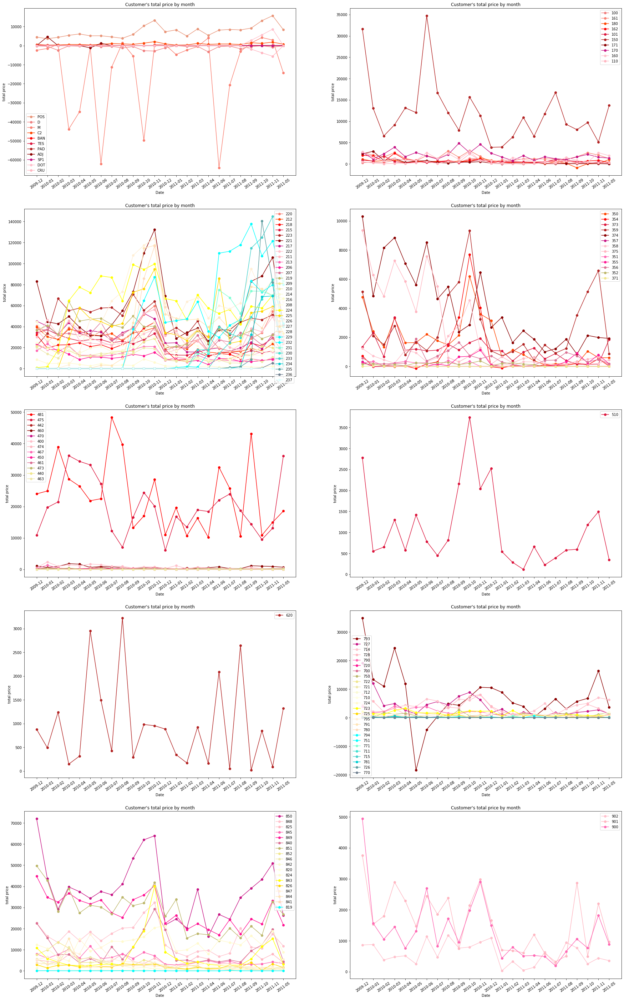

In [45]:
plt.figure(figsize=(30, 50))

for i, product_category_list in enumerate(product_categories_list):
    for j, product_category in enumerate(product_category_list):
        if product_category == 0:
            continue
        t_price = get_category_month_data(data_category_month, product_category)
        plt.subplot(5, 2, i + 1)
        plt.plot(pd.unique(data_category_month.order_month), t_price, marker="o", color=COLOR_LIST[(j + i)%len(COLOR_LIST)])
    plt.xticks(rotation=35) 
    plt.title("Customer's total price by month")
    plt.ylabel("total price")
    plt.xlabel("Date")
    plt.legend(labels=product_category_list[1:], loc="best")
plt.show()

그런데 중간에 궁금한게 생겼다.   
우리가 test에서 구해야하는 customer들은 train set에 다 있을까?   
그리고 product를 보다보면 5개의 숫자로만 이루어져있는 prodcut뿐만 아니라 test, adjust등 알수없는 상품을 사용한 고객을 모두 제한다면 testset은 어떻게 되나

In [140]:
train_data.head(5)

,order_id,product_id,description,quantity,order_date,price,customer_id,country,total,year_month,product_category
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,11.4675,13085,United Kingdom,137.61,2009-12,850
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,11.1375,13085,United Kingdom,133.65,2009-12,793
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,11.1375,13085,United Kingdom,133.65,2009-12,793
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,3.4650,13085,United Kingdom,166.32,2009-12,220
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,2.0625,13085,United Kingdom,49.50,2009-12,212


In [147]:
non_numeric_product_id_val = train_data.product_category == product_categories_list[0][1]

for i in range(2, len(product_categories_list[0])):
    non_numeric_product_id_val |= (train_data.product_category == product_categories_list[0][i])

non_numeric_product_id = train_data[non_numeric_product_id_val]
non_numeric_product_id

,order_id,product_id,description,quantity,order_date,price,customer_id,country,total,year_month,product_category
89,489439,POST,POSTAGE,3,2009-12-01 09:28:00,29.7000,12682,France,89.1000,2009-12,POS
126,489444,POST,POSTAGE,1,2009-12-01 09:55:00,232.6500,12636,USA,232.6500,2009-12,POS
173,489447,POST,POSTAGE,1,2009-12-01 10:10:00,214.5000,12362,Belgium,214.5000,2009-12,POS
611,489526,POST,POSTAGE,6,2009-12-01 11:50:00,29.7000,12533,Germany,178.2000,2009-12,POS
716,C489535,D,Discount,-1,2009-12-01 12:11:00,14.8500,15299,United Kingdom,-14.8500,2009-12,D
...,...,...,...,...,...,...,...,...,...,...,...
779988,579786,POST,POSTAGE,2,2011-11-30 15:31:00,29.7000,12524,Germany,59.4000,2011-11,POS
779995,579790,POST,POSTAGE,2,2011-11-30 15:38:00,46.2000,12784,Portugal,92.4000,2011-11,POS
780064,579792,POST,POSTAGE,5,2011-11-30 15:43:00,29.7000,12714,France,148.5000,2011-11,POS
780273,579870,POST,POSTAGE,2,2011-11-30 16:47:00,29.7000,12437,France,59.4000,2011-11,POS


In [152]:
numeric_product_id = train_data[~non_numeric_product_id_val]
numeric_product_id

,order_id,product_id,description,quantity,order_date,price,customer_id,country,total,year_month,product_category
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,11.4675,13085,United Kingdom,137.6100,2009-12,850
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,11.1375,13085,United Kingdom,133.6500,2009-12,793
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,11.1375,13085,United Kingdom,133.6500,2009-12,793
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,3.4650,13085,United Kingdom,166.3200,2009-12,220
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,2.0625,13085,United Kingdom,49.5000,2009-12,212
...,...,...,...,...,...,...,...,...,...,...,...
780497,C579886,22197,POPCORN HOLDER,-1,2011-11-30 17:39:00,1.4025,15676,United Kingdom,-1.4025,2011-11,221
780498,C579886,23146,TRIPLE HOOK ANTIQUE IVORY ROSE,-1,2011-11-30 17:39:00,5.4285,15676,United Kingdom,-5.4285,2011-11,231
780499,C579887,84946,ANTIQUE SILVER T-LIGHT GLASS,-1,2011-11-30 17:42:00,2.0625,16717,United Kingdom,-2.0625,2011-11,849
780500,C579887,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,-1,2011-11-30 17:42:00,13.1175,16717,United Kingdom,-13.1175,2011-11,850


In [149]:
non_numeric_product_id_customers = pd.unique(non_numeric_product_id.customer_id)
len(non_numeric_product_id_customers)

1122

In [153]:
numeric_product_id_customers = pd.unique(numeric_product_id.customer_id)
len(numeric_product_id_customers)

5848

In [154]:
test_custormer_id = pd.unique(test_data.customer_id)
len(test_custormer_id)

5914

In [156]:
len(set(test_custormer_id) - set(numeric_product_id_customers))

66